In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Análisis financiero del mercado de criptomonedas

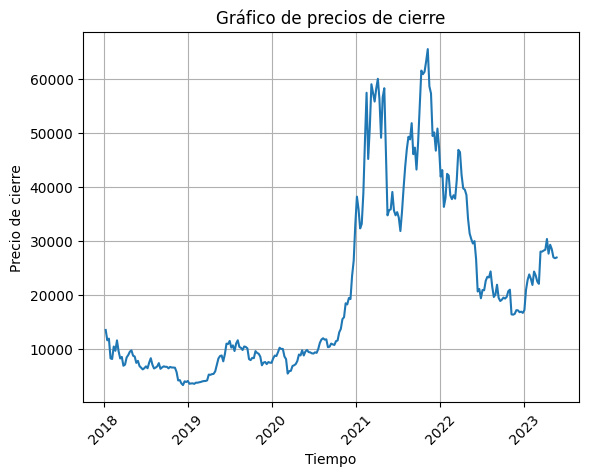

In [ ]:
# Cargar los datos desde el archivo CSV
datos = pd.read_csv('datos_semanal_1w_BTC.csv')

# Convertir los datos de tiempo a formato datetime
datos['Time'] = pd.to_datetime(datos['Time'])

# Tomar los datos de 'Time' y 'Close'
Tiempo = datos['Time']
Precio = datos['Close']

# Crear el gráfico
plt.plot(Tiempo, Precio)
plt.xlabel('Tiempo')
plt.ylabel('Precio de cierre')
plt.title('Gráfico de precios de cierre')
plt.grid()
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para mayor claridad
plt.show()


## 1.2.2 Funcion del Filtro de media Movil

In [ ]:
def filtro_media_movil(datos, ventana):
    data_suavizada = []
    for i in range(len(datos)):
        inicio = max(0, i - ventana + 1)
        final = i + 1
        subset = datos[inicio:final]
        valor_promedio = sum(subset) / len(subset)
        data_suavizada.append(valor_promedio)
    return data_suavizada

## 1.2.3 Suavizando la informacion de los datos usando el filtro de media movil

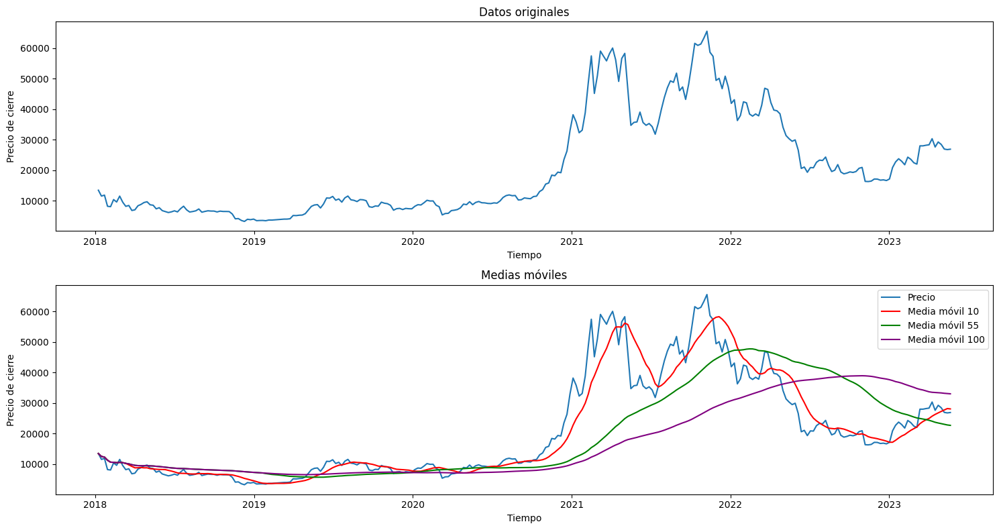

In [ ]:

media_10 = filtro_media_movil(Precio,10)
media_55 = filtro_media_movil(Precio,55)
media_100 = filtro_media_movil(Precio,100)


# Crear los subplots
fig, axs = plt.subplots(2, 1, figsize=(15, 8))

# Gráfico de los datos originales
axs[0].plot(Tiempo, Precio)
axs[0].set_xlabel('Tiempo')
axs[0].set_ylabel('Precio de cierre')
axs[0].set_title('Datos originales')

# Gráfico de las medias móviles
axs[1].plot(Tiempo, Precio, label='Precio')
axs[1].plot(Tiempo, media_10, color='red', label='Media móvil 10')
axs[1].plot(Tiempo, media_55, color='green', label='Media móvil 55')
axs[1].plot(Tiempo, media_100, color='purple', label='Media móvil 100')
axs[1].set_xlabel('Tiempo')
axs[1].set_ylabel('Precio de cierre')
axs[1].set_title('Medias móviles')
axs[1].legend()

# Ajustar la disposición de los subplots
plt.tight_layout()

# Mostrar los gráficos
plt.show()


Con la informacion que nos brinda este indicador tecnico de media movil se puede concluir que la tendencia mas proxima del precio es al alza en las proximas semanas como puede verse la MA de 10 periodos corta a la de 55 pero por otro lado la media de 55 y 100 indica que el precio lleva un desarrollo bajista durante varias semanas lo que nos hace pensar que va seguir cayendo como lo confirma la MA de 100 periodos que empieza a tener una pendiente negativa seria prudente esperar que la MA de 10 cruze la de 50 para tener mas confirmacion del alza del precio. Esto teniendo en cuenta que estamos analizando un grafico semanal y podrian analizarse diferentes temporalidades.

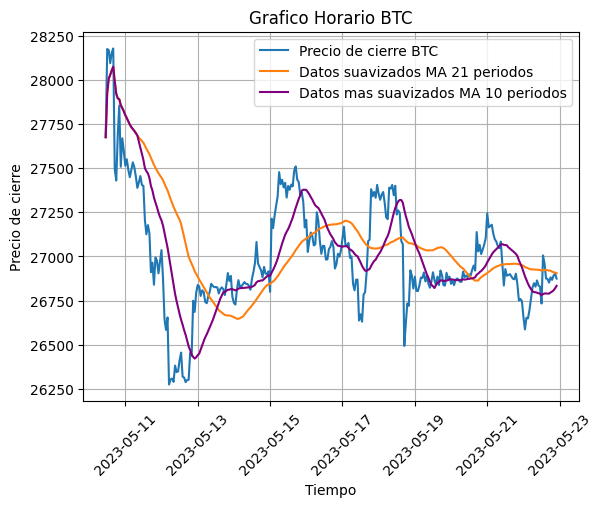

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, ifft

# Cargar los datos desde el archivo CSV
datos = pd.read_csv('datos_horario_1h_BTC.csv')

# Convertir los datos de tiempo a formato datetime
datos['Time'] = pd.to_datetime(datos['Time'])

# Convertir los valores de la columna 'Close' a tipo numérico
datos['Close'] = pd.to_numeric(datos['Close'], errors='coerce')

# Eliminar filas con valores no numéricos en la columna 'Close'
datos = datos.dropna(subset=['Close'])

# Tomar los datos de 'Time' y 'Close'
tiempo = datos['Time']
precio = datos['Close']

MA_21 = filtro_media_movil(precio,50)
MA_10 = filtro_media_movil(precio,21)

# Crear el gráfico
plt.plot(tiempo, precio, label='Precio de cierre BTC')
plt.plot(tiempo, MA_21, label='Datos suavizados MA 21 periodos')
plt.plot(tiempo, MA_10, color='purple' ,label='Datos mas suavizados MA 10 periodos')
plt.xlabel('Tiempo')
plt.ylabel('Precio de cierre')
plt.title('Grafico Horario BTC')
plt.legend()
plt.grid()
plt.xticks(rotation=45)
plt.show()


En este grafico hay mucha mas variacion de las muestras debido a la volatilidad de la moneda en plazos de tiempo cortos como 1 hora, por este motivo el filtro de media movil suaviza mejor la informacion del precio.

La mejor media movil y la mas usada es la de 21 periodos ya que es un punto medio entre suavizar la informacion y sacar un promedio de la temporalidad a la que este el grafico para obtener una estimacion de hacia donde es la tendencia del precio en las proximas velas. 
Ademas utilizando el cruce de medias se puede ver en la primera parte del grafico que la media de 21 toma una pendiente negativa y cruza a la de 50 lo que permite una probabilidad alta de que el precio aumente en las proximas horas.

El cruce de medias móviles puede ser utilizado en diferentes intervalos de tiempo, desde gráficos diarios hasta gráficos de minutos o incluso segundos, dependiendo del plazo de tiempo en el que se quiera hacer una inversion.


## 2. Aplicación de filtros en cascada para procesar señales de audio

In [ ]:
from matplotlib.pylab import *
from scipy import *
from scipy.io.wavfile import read, write
import scipy.signal as signal
from scipy.signal import kaiserord, lfilter, firwin, freqz
from IPython.display import Audio #librería para escuchar el audio
import scipy.io.wavfile as waves

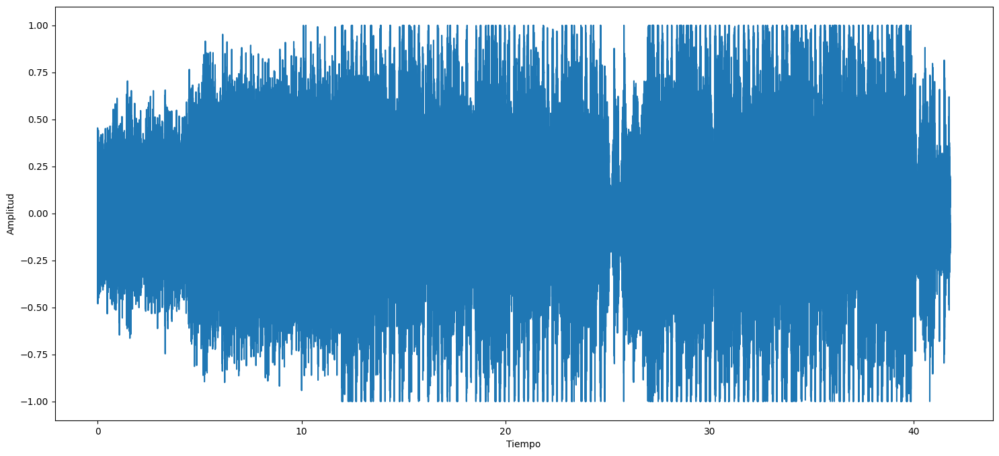

<class 'numpy.ndarray'>


In [ ]:
#cargar el audio correspondiente
fs,audio=waves.read('CRW.wav') 
audio=audio/float(np.max(np.abs(audio)))

num_channels = audio.shape[1] if len(audio.shape) > 1 else 1

# Si el audio tiene más de un canal, eliminar el canal no deseado
if num_channels > 1:
    # Eliminar el segundo canal (canal 1)
    audio = audio[:, 0]

#grafica
t=np.arange(0,float(len(audio))/fs,1/fs) 
plt.figure(figsize=(18,8))
plt.plot(t,audio)
plt.xlabel('Tiempo')
plt.ylabel('Amplitud') 
plt.show()

#Audio
print(type(audio))
Audio(audio,rate=fs)


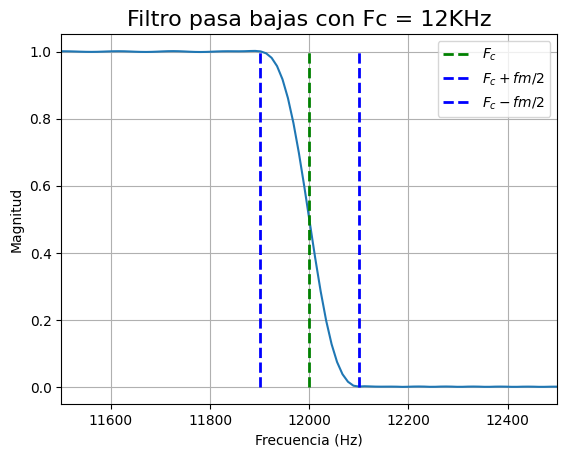

In [ ]:
N = 513 # Numero de puntos de la FFT
fs= 44000 # frec de muestreo
nyq_rate = fs / 2.0
roll_off = 200.0
fc = 12000 # Frecuencia de corte 12KHz
width = roll_off/nyq_rate
ripple_db = 60.0 # Atenuacion deseada en la banda de rechazo, en dB.

N, _= kaiserord(ripple_db, width) # Calcular el orden y el parametro de Kaiser para el filtro FIR
taps = firwin(N, fc/nyq_rate, pass_zero='lowpass')
w, h = signal.freqz(taps, [1], worN=2000)

plt.plot(nyq_rate*w/np.pi, np.abs(h))
plt.vlines(fc, 0, 1, color='g', lw=2, linestyle='--',label='$F_c$')
plt.vlines(fc+roll_off/2, 0, 1, color='b', lw=2, linestyle='--',label='$F_c+fm/2$')
plt.vlines(fc-roll_off/2, 0, 1, color='b', lw=2, linestyle='--',label='$F_c-fm/2$')
xlim(11500,12500)
plt.title('Filtro pasa bajas con Fc = 12KHz', fontsize=16)
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Magnitud')
plt.legend(loc='best')
plt.grid()
plt.show()


In [ ]:
filtered_1 = lfilter(taps, 1.0, audio)

Audio(filtered_1,rate=fs)

Ahora el filtro Pasa-Altas

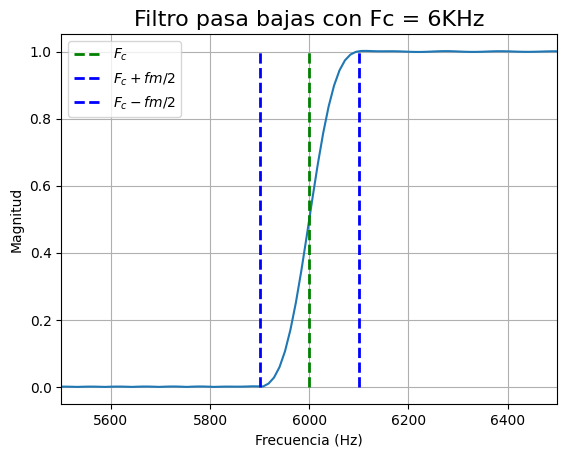

In [ ]:
N = 513 # Numero de puntos de la FFT
nyq_rate = fs / 2.0
roll_off = 200.0
fc = 6000 # en Hz
width = roll_off/nyq_rate
ripple_db = 60.0 # Atenuacion deseada en la banda de rechazo, en dB.

N, _= kaiserord(ripple_db, width) # Calcular el orden y el parametro de Kaiser para el filtro FIR
taps = firwin(N, fc/nyq_rate, pass_zero='highpass')
w, h = signal.freqz(taps, [1], worN=2000)

plt.plot(nyq_rate*w/np.pi, np.abs(h))
plt.vlines(fc, 0, 1, color='g', lw=2, linestyle='--',label='$F_c$')
plt.vlines(fc+roll_off/2, 0, 1, color='b', lw=2, linestyle='--',label='$F_c+fm/2$')
plt.vlines(fc-roll_off/2, 0, 1, color='b', lw=2, linestyle='--',label='$F_c-fm/2$')
xlim(5500,6500)
plt.title('Filtro pasa bajas con Fc = 6KHz', fontsize=16)
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Magnitud')
plt.legend(loc='best')
plt.grid()
plt.show()

Implementando el filtro Pasa-Banda

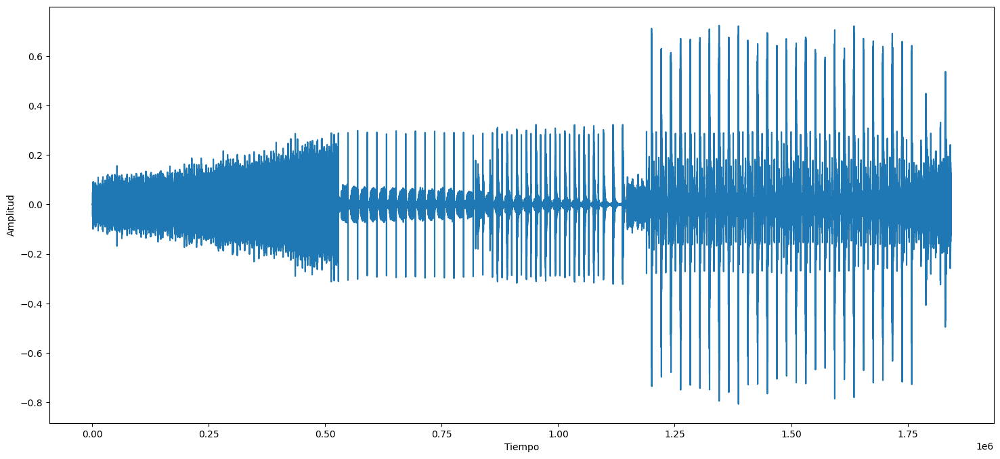

In [ ]:
filtered_2 = lfilter(taps, 1.0, filtered_1)

#grafica
t=np.arange(0,len(filtered_2))
plt.figure(figsize=(18,8))
plt.plot(t,filtered_2)
plt.xlabel('Tiempo')
plt.ylabel('Amplitud') 
plt.show()

Audio(filtered_2,rate=fs)

Se nota una gran diferencia en el audio filtrado el cual no contiene bajos ni sonidos muy agudos solo se esucha un poco el tambor y los platillos.

# 3. Análisis del espectrograma luego de aplicar filtros digitales respuesta del filtro.

In [ ]:
def extraer_ventanas(signal, size, fs):
    #Tamano de paso
    step=int(0.010*fs)
    n_seg = int((len(signal) - size) / step)
    # extraer segmentos
    windows = [signal[i * step : i * step + size]
                for i in range(n_seg)]
    # stack (cada fila es una ventana)
    return np.vstack(windows)

def potspec(X, size, n_padded_min=0):
    # Zero padding para la proxima potencia de 2
    if n_padded_min==0:
        n_padded = max(n_padded_min, int(2 ** np.ceil(np.log(size) / np.log(2))))
    else:
        n_padded = n_padded_min
        
    # Transformada de Fourier
    Y = np.fft.fft(X, n=n_padded)
    Y = np.absolute(Y)
    
    # non-redundant part
    m = int(n_padded / 2) + 1
    Y = Y[:, :m]
    return np.abs(Y) ** 2, n_padded

2. Grafique la representación tiempo-frecuencia obtenida en el ítem anterior.

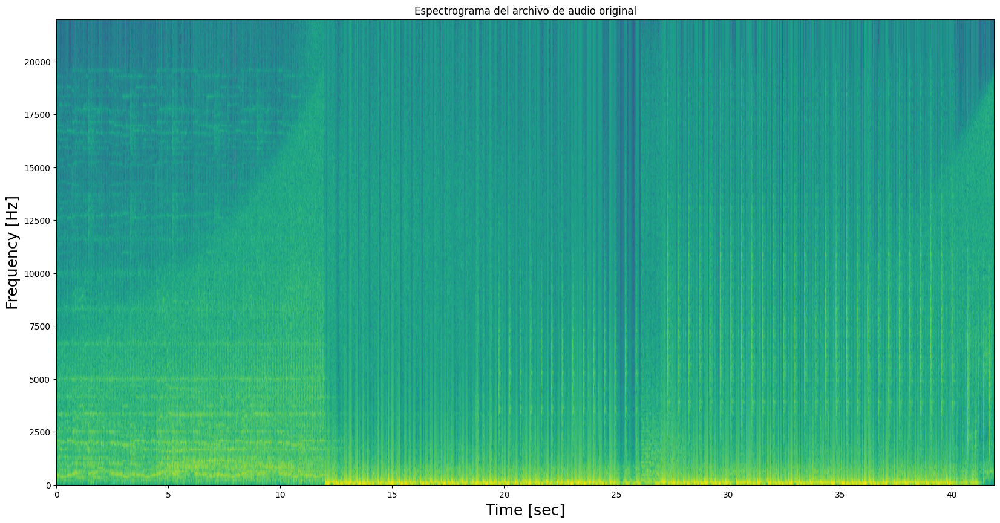

In [ ]:
windows = extraer_ventanas(audio, int(0.05* fs),fs)
ventana = np.hamming(int(0.05*fs))
windows_hamming = windows*ventana

espectro,nfft=potspec(windows_hamming,(0.05*fs),513)
espectro=np.flipud(10*np.log10(espectro).T)
plt.figure(figsize=(20,10))
plt.title('Espectrograma del archivo de audio original')
plt.imshow(espectro,aspect='auto', extent=[0, len(audio)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize=18)
plt.xlabel('Time [sec]', fontsize=18)
plt.show()

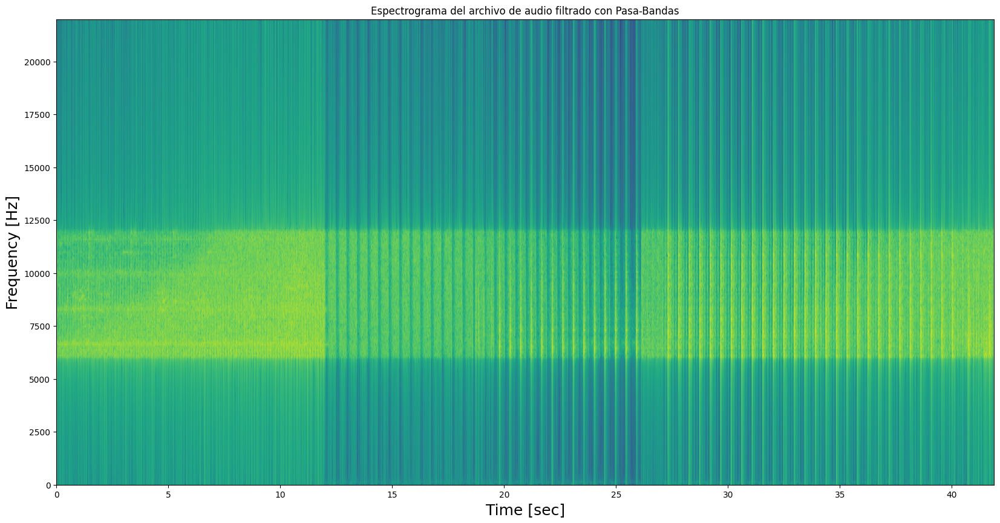

In [ ]:
windows = extraer_ventanas(filtered_2, int(0.05* fs),fs)
ventana = np.hamming(int(0.05*fs))
windows_hamming = windows*ventana

espectro,nfft=potspec(windows_hamming,(0.05*fs),513)
espectro=np.flipud(10*np.log10(espectro).T)
plt.figure(figsize=(20,10))
plt.title('Espectrograma del archivo de audio filtrado con Pasa-Bandas')
plt.imshow(espectro,aspect='auto', extent=[0, len(audio)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize=18)
plt.xlabel('Time [sec]', fontsize=18)
plt.show()

Al implementar estos dos filtros consecutivamente, se logra obtener una señal de audio filtrada que ha sido modificada en su espectro de frecuencias. El filtro pasabajas elimina las altas frecuencias no deseadas, mientras que el filtro pasaaltas elimina las bajas frecuencias no deseadas. Esto puede ayudar a resaltar ciertos aspectos de la pista de audio, como los tonos medios y altos, o crear efectos y transiciones más suaves entre diferentes pistas.
hay que tener en cuenta que para realizar un pasa-banda la frecuencia de corte del filtro pasa-bajas debe ser mayor a la frecuencia de corte del filtro pasa-altas.

# Rechaza-Bandas 
con atenuacion desde los 8K Hz hasta los 15KHz.

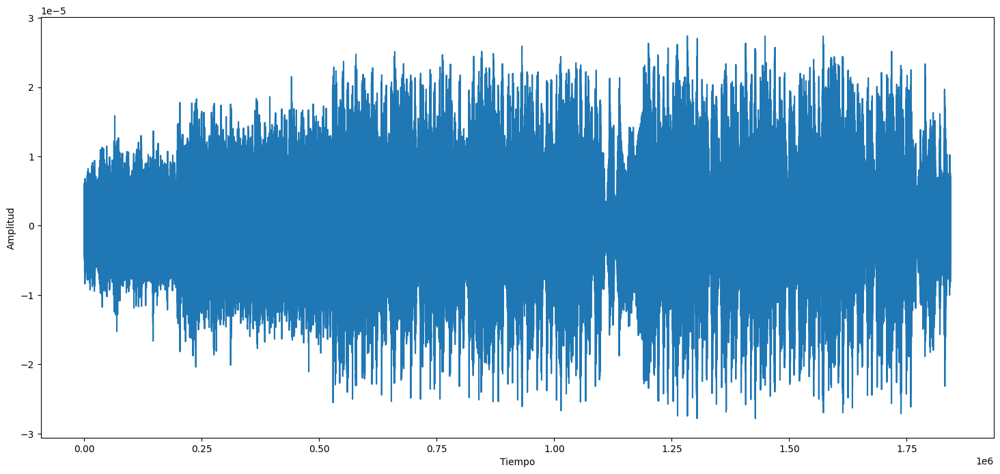

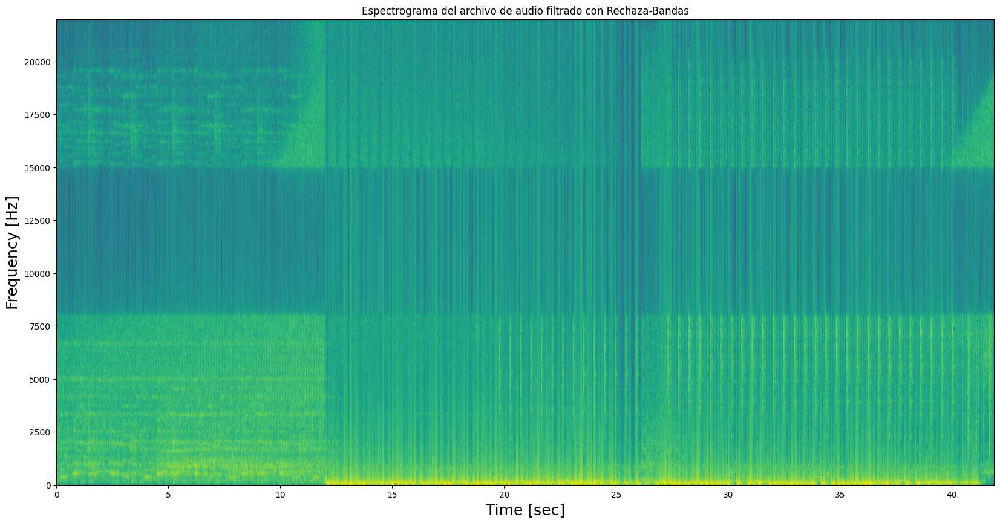

In [ ]:
#primero el pasa-bajas
N = 513 # Numero de puntos de la FFT
fs= 44000 # frec de muestreo
nyq_rate = fs / 2.0
roll_off = 200.0
fc = 8000 # Frecuencia de corte 8KHz
width = roll_off/nyq_rate
ripple_db = 60.0 #The desired attenuation in the stop band, in dB.

N, _= kaiserord(ripple_db, width) # Compute the order and Kaiser parameter for the FIR filter.
taps = firwin(N, fc/nyq_rate, pass_zero='lowpass')

filtered_1 = lfilter(taps, 1.0, audio)

#luego el pasa-altas
fc = 15000 # Frecuencia de corte 10KHz
width = roll_off/nyq_rate
ripple_db = 60.0 #The desired attenuation in the stop band, in dB.
N, _= kaiserord(ripple_db, width) # Compute the order and Kaiser parameter for the FIR filter.
taps = firwin(N, fc/nyq_rate, pass_zero='highpass')

filtered_2 = lfilter(taps, 1.0, filtered_1)

#grafica
t=np.arange(0,len(filtered_2))
plt.figure(figsize=(18,8))
plt.plot(t,filtered_2)
plt.xlabel('Tiempo')
plt.ylabel('Amplitud') 
plt.show()

windows = extraer_ventanas(filtered_2, int(0.05* fs),fs)
ventana = np.hamming(int(0.05*fs))
windows_hamming = windows*ventana

espectro,nfft=potspec(windows_hamming,(0.05*fs),513)
espectro=np.flipud(10*np.log10(espectro).T)
plt.figure(figsize=(20,10))
plt.title('Espectrograma del archivo de audio filtrado con Rechaza-Bandas')
plt.imshow(espectro,aspect='auto', extent=[0, len(audio)/fs, 0, fs//2])
plt.ylabel('Frequency [Hz]', fontsize=18)
plt.xlabel('Time [sec]', fontsize=18)
plt.show()

#Audio(filtered_2,rate=fs)

Se puede ver que la señal en el tiempo no resulta tan afectada ya que la mayor parte de la potencia del audio se encuentra en las frecuencias bajas y algunas medias.
En el esprectrograma puede apreciarce claramente el efecto del filtro y como este ha eliminado un rango de frecuencias desde los 8KHz hasta los 15KHz.

# Conclusiones

* El filtro de media móvil es una solución rápida y fácil para filtrar ruido de alta frecuencia, pero presenta dos debilidades: primero su banda de rechazo tiene poca atenuación y segundo no permite ajustar el ancho de banda de manera independiente de la atenuación. Combinar filtros de media móvil de diferente largo mejora el primer aspecto, pero aun así no permite el ajuste independiente del ancho de banda.

* El filtro de media móvil nos ayudará a identificar patrones y tendencias de precios más fácilmente, lo que puede ser útil para tomar decisiones informadas sobre inversiones en criptomonedas.

* La Media Móvil es un indicador técnico que utilizan los inversores para detectar las tendencias emergentes y comunes de los mercados. Es una fórmula matemática que se utiliza para encontrar medias utilizando datos para encontrar tendencias y suavizar la acción de los precios filtrando el «ruido» de las fluctuaciones rápidas aleatorias.

* Dependiendo de la duración de la señal, el número de muestras que se usan para calcular la media y el tiempo entre ellas puede afectar más o menos a la señal original.


* El cruce de medias móviles de diferentes temporalidades es una estrategia comúnmente utilizada por los traders para identificar señales de compra o venta. Cuando una media móvil más corta cruza por encima de una media móvil más larga, se considera una señal de compra, indicando un posible aumento en el precio. Por otro lado, cuando una media móvil más corta cruza por debajo de una media móvil más larga, se interpreta como una señal de venta, indicando una posible disminución en el precio.

* Es importante destacar que el cruce de medias móviles no garantiza una predicción precisa del movimiento de precios y puede generar señales falsas en condiciones de mercado volátiles o laterales. Por lo tanto, es recomendable combinar esta estrategia con otros indicadores técnicos y análisis fundamentales para obtener una visión más completa del mercado antes de tomar decisiones de inversión.

* Al aplicar filtros digitales a una señal y analizar el espectrograma resultante, puedes observar cómo cambia la distribución de energía en diferentes frecuencias a lo largo del tiempo. Los filtros pueden eliminar componentes de frecuencia no deseados, enfatizar ciertos rangos de frecuencia o alterar la forma y el contenido del espectrograma.

